# **IMPORTAMOS LAS LIBRERIAS QUE VAMOS A USAR**

In [2]:
import pandas as pd       # Para manipulación y análisis de datos en estructuras tipo DataFrame
import matplotlib.pyplot as plt  # Para crear gráficos estáticos como líneas, barras, dispersión, etc.
import numpy as np        # Para cálculos numéricos eficientes y trabajar con arrays
import seaborn as sns     # Para visualizaciones estadísticas más atractivas y detalladas
import folium             # Para generar mapas interactivos con visualización geográfica

### Importación de datos



In [3]:


url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda1 = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tienda1.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


Agrupar funciones
# Agrupamos las funcionesb

In [4]:
# Realizamos una función en la cual imprimimos cada uno de los ingresos


'''
La función calcular_e_imprimir_ingresos toma una lista de DataFrames, y por cada uno calcula el
total de la columna 'Precio' e imprime ese total con el número de tienda correspondiente, comenzando desde 1.
'''

def calcular_e_imprimir_ingresos(lista_tiendas):
  ingresos = {} #Guardamos los resultados de cada suma
  for i, tienda in enumerate(lista_tiendas, start=1):
        ingreso = sum(tienda['Precio'])
        ingresos[f"Tienda {i}"] = ingreso
  return ingresos  # Por si también quieres usar los datos luego

# Función para formatear valores como dinero en pesos colombianos con punto como separador de miles
def formatear_pesos(valor):
    return f"${valor:,.0f}".replace(",", ".")

# Función para obtener el número de ventas por categoría en una tienda
def obtener_ventas_por_categoria(tienda_df):
    """Retorna un diccionario con la cantidad de productos vendidos por categoría."""
    return tienda_df['Categoría del Producto'].value_counts().to_dict()
def obtener_ventas_por_categoria(tienda_df):
    """Retorna un diccionario con el conteo de ventas por categoría de producto para una tienda."""
    return tienda_df['Categoría del Producto'].value_counts().to_dict()



#1. Análisis de facturación



In [33]:
# Llamado a la función
ingresos = calcular_e_imprimir_ingresos([tienda1, tienda2, tienda3, tienda4])
print(ingresos)
diferencia = ingresos["Tienda 1"] - ingresos["Tienda 4"]
print("Diferencia entre Tienda 1 y Tienda 4:", formatear_pesos(diferencia))

{'Tienda 1': 1150880400.0, 'Tienda 2': 1116343500.0, 'Tienda 3': 1098019600.0, 'Tienda 4': 1038375700.0}
Diferencia entre Tienda 1 y Tienda 4: $112.504.700


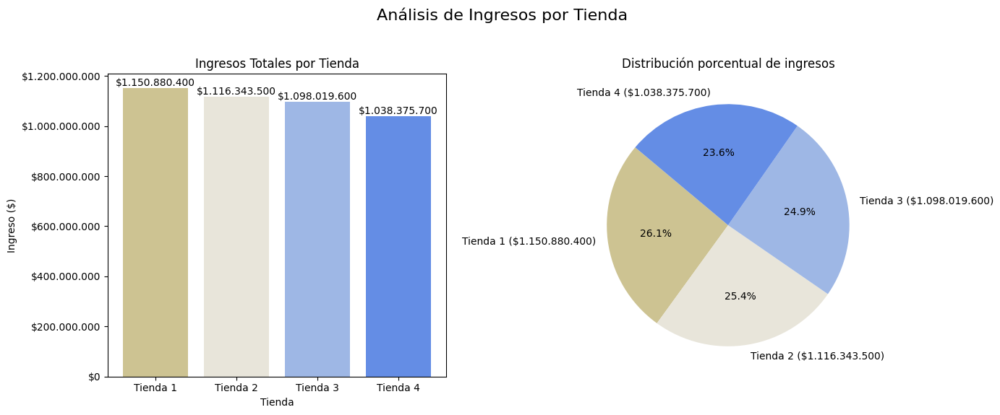

In [6]:
'''
Gráfico combinado de barras y torta para representar los ingresos por tienda.
Formato visual cuidado, con separadores de miles en formato pesos y paleta de colores personalizada.
'''

from matplotlib.ticker import FuncFormatter



# Crear figura con dos subgráficos: gráfico de barras y gráfico de torta
fig, axs = plt.subplots(1, 2, figsize=(14, 6))
fig.suptitle("Análisis de Ingresos por Tienda", fontsize=16)

# Paleta de colores personalizada tomada de la página de coolors.co
colores = ['#CDC392', '#E8E5DA', '#9EB7E5', '#648DE5', '#A9B388', '#C4C3D0', '#B3C8F2', '#4A73B1']

# GRÁFICO DE BARRAS
axs[0].bar(ingresos.keys(), ingresos.values(), color=colores)
axs[0].set_title("Ingresos Totales por Tienda")
axs[0].set_xlabel("Tienda")
axs[0].set_ylabel("Ingreso ($)")

# Formatear el eje Y como pesos
axs[0].yaxis.set_major_formatter(FuncFormatter(lambda x, _: f"${x:,.0f}".replace(",", ".")))

# Agregar etiquetas de valor sobre cada barra
for i, (nombre, valor) in enumerate(ingresos.items()):
    axs[0].text(i, valor, formatear_pesos(valor), ha='center', va='bottom')

# GRÁFICO DE TORTA
axs[1].pie(
    ingresos.values(),
    labels=[f"{nombre} ({formatear_pesos(valor)})" for nombre, valor in ingresos.items()],
    autopct='%1.1f%%',
    startangle=140,
    colors=colores
)
axs[1].set_title("Distribución porcentual de ingresos")

# Ajustar espaciado general de la figura
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [28]:
# Concatenar todas las tiendas
ventas = pd.concat([tienda1, tienda2, tienda3, tienda4])

# Calcular ingreso bruto, ingreso neto y costo total de envío por tienda
ventas["Ingreso_Neto"] = ventas["Precio"] - ventas["Costo de envío"]

resumen = ventas.groupby("Tienda").agg(
    Ingreso_Bruto=("Precio", "sum"),
    Ingreso_Neto=("Ingreso_Neto", "sum"),
    Costo_Envio_Total=("Costo de envío", "sum")
).reset_index()

# Aplicar formato a las columnas numéricas del resumen
resumen_formateado = resumen.copy()
resumen_formateado["Ingreso_Bruto"] = resumen_formateado["Ingreso_Bruto"].apply(formatear_pesos)
resumen_formateado["Ingreso_Neto"] = resumen_formateado["Ingreso_Neto"].apply(formatear_pesos)
resumen_formateado["Costo_Envio_Total"] = resumen_formateado["Costo_Envio_Total"].apply(formatear_pesos)

# Calcular columna porcentual
resumen["%_Envio_vs_Ingreso"] = resumen["Costo_Envio_Total"] / resumen["Ingreso_Bruto"] * 100

# Aplicar formato a las columnas numéricas y porcentaje
resumen_formateado = resumen.copy()
resumen_formateado["Ingreso_Bruto"] = resumen_formateado["Ingreso_Bruto"].apply(formatear_pesos)
resumen_formateado["Ingreso_Neto"] = resumen_formateado["Ingreso_Neto"].apply(formatear_pesos)
resumen_formateado["Costo_Envio_Total"] = resumen_formateado["Costo_Envio_Total"].apply(formatear_pesos)
resumen_formateado["%_Envio_vs_Ingreso"] = resumen["%_Envio_vs_Ingreso"].apply(lambda x: f"{x:.2f}%")

# Mostrar tabla
print("📊 Resumen Financiero por Tienda (Formateado):")
display(resumen_formateado)

📊 Resumen Financiero por Tienda (Formateado):


,Tienda,Ingreso_Bruto,Ingreso_Neto,Costo_Envio_Total,%_Envio_vs_Ingreso
0,Tienda 1,$1.150.880.400,$1.089.502.500,$61.377.900,5.33%
1,Tienda 2,$1.116.343.500,$1.056.858.400,$59.485.100,5.33%
2,Tienda 3,$1.098.019.600,$1.039.503.000,$58.516.600,5.33%
3,Tienda 4,$1.038.375.700,$983.058.300,$55.317.400,5.33%


# 2. Ventas por categoría

In [ ]:
'''
Bloque para imprimir la cantidad de ventas por categoría
en cada tienda de forma clara y ordenada.
'''


# Iterar por cada tienda y mostrar las ventas por categoría
for i, tienda in enumerate([tienda1, tienda2, tienda3, tienda4], start=1):
    ventas = obtener_ventas_por_categoria(tienda)
    print(f"\n Ventas por categoría en Tienda {i}:")
    for categoria, cantidad in ventas.items():
        print(f"   - {categoria}: {cantidad} ventas")

In [14]:
'''
Generar un resumen ordenado de ventas por categoría para cada tienda,
mostrando de mayor a menor la cantidad de ventas.
'''

resumen_ventas_ordenado = {}

# Recorremos cada tienda y su nombre asociado
for tienda_df, nombre in zip(tiendas, nombres):
    ventas = obtener_ventas_por_categoria(tienda_df)  # Conteo de ventas por categoría

    if ventas:
        # Ordenar las categorías de mayor a menor según cantidad de ventas
        ventas_ordenadas = dict(sorted(ventas.items(), key=lambda x: x[1], reverse=True))
        resumen_ventas_ordenado[nombre] = ventas_ordenadas

# Imprimir el resumen ordenado de forma clara
for tienda, ventas in resumen_ventas_ordenado.items():
    print(f"\n {tienda}:")
    for categoria, cantidad in ventas.items():
        print(f"   - {categoria}: {cantidad} ventas")


 Tienda 1:
   - Muebles: 465 ventas
   - Electrónicos: 448 ventas
   - Juguetes: 324 ventas
   - Electrodomésticos: 312 ventas
   - Deportes y diversión: 284 ventas
   - Instrumentos musicales: 182 ventas
   - Libros: 173 ventas
   - Artículos para el hogar: 171 ventas

 Tienda 2:
   - Muebles: 442 ventas
   - Electrónicos: 422 ventas
   - Juguetes: 313 ventas
   - Electrodomésticos: 305 ventas
   - Deportes y diversión: 275 ventas
   - Instrumentos musicales: 224 ventas
   - Libros: 197 ventas
   - Artículos para el hogar: 181 ventas

 Tienda 3:
   - Muebles: 499 ventas
   - Electrónicos: 451 ventas
   - Juguetes: 315 ventas
   - Electrodomésticos: 278 ventas
   - Deportes y diversión: 277 ventas
   - Libros: 185 ventas
   - Instrumentos musicales: 177 ventas
   - Artículos para el hogar: 177 ventas

 Tienda 4:
   - Muebles: 480 ventas
   - Electrónicos: 451 ventas
   - Juguetes: 338 ventas
   - Deportes y diversión: 277 ventas
   - Electrodomésticos: 254 ventas
   - Artículos para e

{'Muebles': 465, 'Electrónicos': 448, 'Juguetes': 324, 'Electrodomésticos': 312, 'Deportes y diversión': 284, 'Instrumentos musicales': 182, 'Libros': 173, 'Artículos para el hogar': 171}
{'Muebles': 442, 'Electrónicos': 422, 'Juguetes': 313, 'Electrodomésticos': 305, 'Deportes y diversión': 275, 'Instrumentos musicales': 224, 'Libros': 197, 'Artículos para el hogar': 181}
{'Muebles': 499, 'Electrónicos': 451, 'Juguetes': 315, 'Electrodomésticos': 278, 'Deportes y diversión': 277, 'Libros': 185, 'Instrumentos musicales': 177, 'Artículos para el hogar': 177}
{'Muebles': 480, 'Electrónicos': 451, 'Juguetes': 338, 'Deportes y diversión': 277, 'Electrodomésticos': 254, 'Artículos para el hogar': 201, 'Libros': 187, 'Instrumentos musicales': 170}


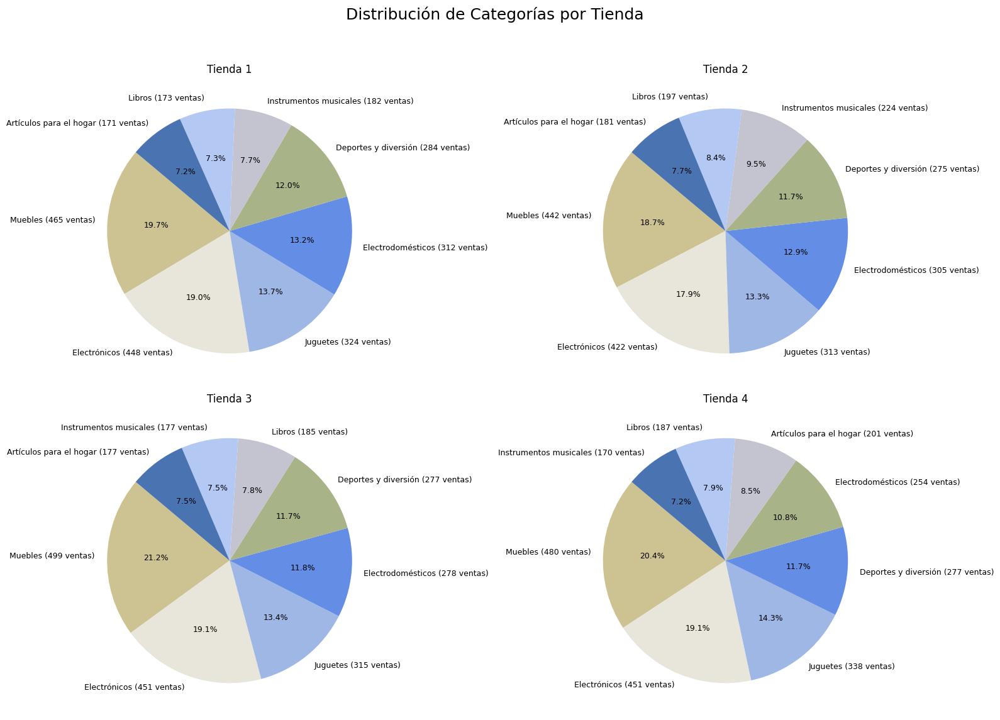

In [34]:
'''
Bloque para graficar la distribución de ventas por categoría
en cada tienda mediante gráficos de torta (1 por tienda).
'''

# Crear figura con disposición de 2x2 subgráficos
fig, axs = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Distribución de Categorías por Tienda", fontsize=18)

# Definimos las tiendas y sus nombres
tiendas = [tienda1, tienda2, tienda3, tienda4]
nombres = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']

# Iterar para cada tienda y crear un gráfico de torta individual
for i, (tienda_df, nombre) in enumerate(zip(tiendas, nombres)):
    ventas = obtener_ventas_por_categoria(tienda_df)  # Diccionario: {categoría: cantidad}
    print(ventas)

    labels = [f"{cat} ({cant} ventas)" for cat, cant in ventas.items()]  # Etiquetas con cantidad
    valores = list(ventas.values())  # Cantidades para la torta

    row, col = divmod(i, 2)  # Ubicación en la grilla 2x2

    axs[row][col].pie(
        valores,
        labels=labels,
        autopct='%1.1f%%',           # Mostrar porcentaje en la torta
        startangle=140,              # Rotación inicial
        colors=colores[:len(valores)],
        textprops={'fontsize': 9}    # Tamaño del texto interno
    )
    axs[row][col].set_title(nombre)

# Ajustar los espacios entre los subgráficos
plt.subplots_adjust(wspace=0.4, hspace=0.4)   # Espacio entre columnas y filas
plt.tight_layout(rect=[0, 0.03, 1, 0.95])     # Deja espacio para el título general
plt.show()

Ventas por Categoría en Todas las Tiendas:


,Artículos para el hogar,Deportes y diversión,Electrodomésticos,Electrónicos,Instrumentos musicales,Juguetes,Libros,Muebles
Tienda 1,171,284,312,448,182,324,173,465
Tienda 2,181,275,305,422,224,313,197,442
Tienda 3,177,277,278,451,177,315,185,499
Tienda 4,201,277,254,451,170,338,187,480



🔢 Ventas totales por categoría:
Muebles: 1886 unidades
Electrónicos: 1772 unidades
Juguetes: 1290 unidades
Electrodomésticos: 1149 unidades
Deportes y diversión: 1113 unidades
Instrumentos musicales: 753 unidades
Libros: 742 unidades
Artículos para el hogar: 730 unidades


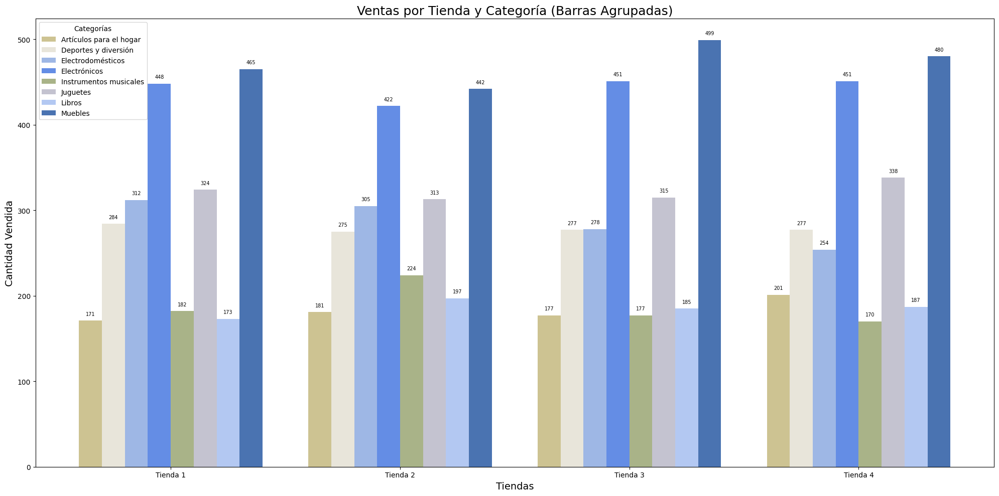

In [38]:
'''
# Bloque para graficar las ventas por categoría en cada tienda
# mediante un gráfico de barras agrupadas por tienda.
'''

# Paso 1: Crear lista completa de categorías únicas
categorias = set()
for tienda_df in tiendas:
    categorias.update(tienda_df['Categoría del Producto'].unique())
categorias = sorted(list(categorias))  # Convertimos a lista ordenada

# Paso 2: Construir matriz de cantidades (4 filas = tiendas, 8 columnas = categorías)
data = []
for tienda_df in tiendas:
    ventas = obtener_ventas_por_categoria(tienda_df)
    data.append([ventas.get(cat, 0) for cat in categorias])

data = np.array(data)  # Convertimos a array NumPy

# Paso adicional: crear nombres de fila (tiendas)
nombres = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']

# Convertir array a DataFrame con nombres
df_ventas = pd.DataFrame(data, index=nombres, columns=categorias)

# Mostrar tabla
print("Ventas por Categoría en Todas las Tiendas:")
display(df_ventas)
# Total por categoría
total_categoria = df_ventas.sum(axis=0).sort_values(ascending=False)

# Total por tienda
total_tienda = df_ventas.sum(axis=1)

# Mostrar resumen total por categoría
print("\n Ventas totales por categoría:")
for categoria, total in total_categoria.items():
    print(f"{categoria}: {total} unidades")

# Paso 3: Preparar gráfico de barras agrupadas
x = np.arange(len(nombres))  # Posiciones para cada tienda en el eje X
width = 0.1                  # Ancho de cada barra individual

fig, ax = plt.subplots(figsize=(20, 10))

# Iterar por cada categoría para graficar sus barras sobre las tiendas
for i, categoria in enumerate(categorias):
    barras = ax.bar(
        x + i * width,                 # Posición desplazada por categoría
        data[:, i],                   # Cantidad vendida por tienda para esa categoría
        width,
        label=categoria,
        color=colores[i % len(colores)]
    )

    # Agregar etiquetas de cantidad sobre cada barra
    for bar in barras:
        yval = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            yval + max(data.flatten()) * 0.01,  # Pequeño desplazamiento hacia arriba
            int(yval),
            ha='center',
            va='bottom',
            fontsize=7
        )

# Personalización del gráfico
ax.set_xlabel('Tiendas', fontsize=14)
ax.set_ylabel('Cantidad Vendida', fontsize=14)
ax.set_title('Ventas por Tienda y Categoría (Barras Agrupadas)', fontsize=18)

# Ajustar las etiquetas del eje X para que estén centradas
ax.set_xticks(x + (width * len(categorias)) / 2 - width / 2)
ax.set_xticklabels(nombres)

# Leyenda y formato final
ax.legend(title="Categorías", fontsize=10)
plt.tight_layout()
plt.show()

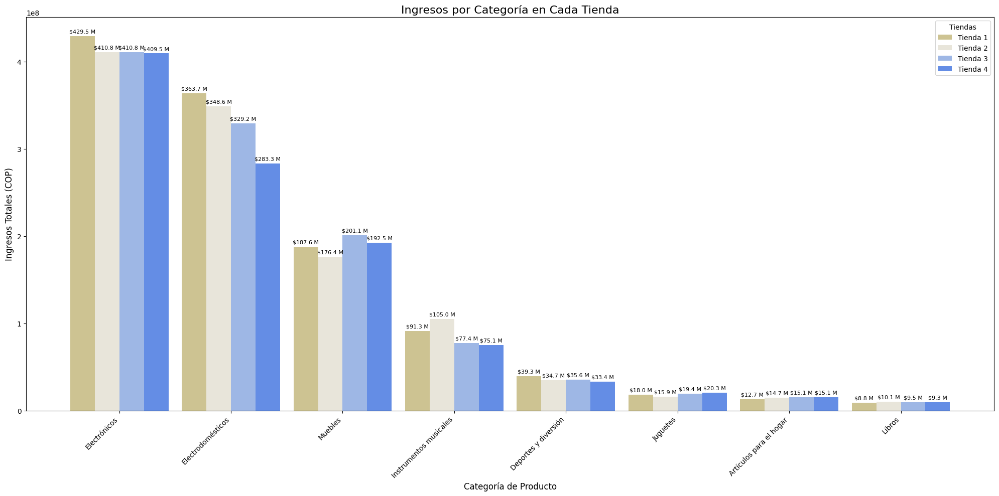

In [13]:
'''
Gráfico de barras agrupadas para representar los ingresos totales
por categoría de producto en cada tienda.
'''

from collections import defaultdict

# Paso 1: Crear lista de ingresos por categoría para cada tienda
ingresos_por_tienda = []
for tienda in tiendas:
    ingresos = tienda.groupby("Categoría del Producto")["Precio"].sum().to_dict()
    ingresos_por_tienda.append(ingresos)

# Paso 2: Calcular el ingreso total por categoría sumando las 4 tiendas
ingresos_totales_por_categoria = defaultdict(float)
for tienda_ingresos in ingresos_por_tienda:
    for cat, val in tienda_ingresos.items():
        ingresos_totales_por_categoria[cat] += val

# Paso 3: Ordenar las categorías por ingreso total (de mayor a menor)
categorias_ingresos = sorted(ingresos_totales_por_categoria, key=ingresos_totales_por_categoria.get, reverse=True)

# Paso 4: Construir matriz de ingresos por tienda (filas: tiendas, columnas: categorías)
ingresos_data = []
for ingresos in ingresos_por_tienda:
    ingresos_data.append([ingresos.get(cat, 0) for cat in categorias_ingresos])
ingresos_data = np.array(ingresos_data)

# Paso 5: Crear gráfico de barras agrupadas
x = np.arange(len(categorias_ingresos))  # Posiciones en el eje X
width = 0.22                             # Ancho de cada barra individual

fig, ax = plt.subplots(figsize=(20, 10))

# Dibujar las barras para cada tienda
for i in range(4):
    barras = ax.bar(
        x + i * width,
        ingresos_data[i],
        width,
        label=nombres[i],
        color=colores[i]
    )

    # Agregar etiquetas con el valor (en millones) sobre cada barra
    for bar in barras:
        yval = bar.get_height()
        yval_millones = yval / 1_000_000
        texto = f"${yval_millones:.1f} M"
        ax.text(
            bar.get_x() + bar.get_width() / 2,
            yval + max(ingresos_data.flatten()) * 0.006,  # Separación visual proporcional
            texto,
            ha='center',
            va='bottom',
            fontsize=8
        )

# Personalización del gráfico
ax.set_xlabel('Categoría de Producto', fontsize=12)
ax.set_ylabel('Ingresos Totales (COP)', fontsize=12)
ax.set_title('Ingresos por Categoría en Cada Tienda', fontsize=16)
ax.set_xticks(x + 1.5 * width)  # Centrar etiquetas
ax.set_xticklabels(categorias_ingresos, rotation=45, ha='right')
ax.legend(title="Tiendas")

plt.tight_layout()
plt.show()

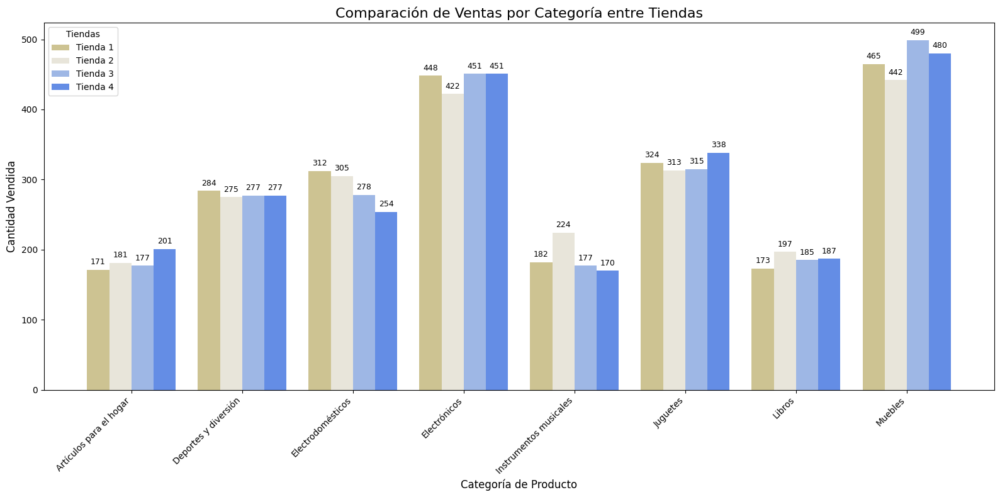

In [12]:
'''
# Gráfico de barras agrupadas para comparar la cantidad vendida
# por categoría de producto entre las diferentes tiendas.
'''

# Paso 1: Obtener todas las categorías presentes en los datos
categorias = set()
for tienda_df in tiendas:
    categorias.update(tienda_df['Categoría del Producto'].unique())
categorias = sorted(list(categorias))  # Lista ordenada alfabéticamente

# Paso 2: Construir la matriz de datos (4 tiendas x N categorías)
data = []
for tienda_df in tiendas:
    ventas = obtener_ventas_por_categoria(tienda_df)  # Diccionario {categoría: cantidad}
    data.append([ventas.get(cat, 0) for cat in categorias])  # 0 si no existe la categoría en esa tienda

data = np.array(data)  # Convertimos a matriz NumPy

# Paso 3: Preparar posiciones para el gráfico
x = np.arange(len(categorias))  # Una posición por categoría
width = 0.2                     # Ancho de cada barra

# Crear el gráfico
fig, ax = plt.subplots(figsize=(16, 8))

# Dibujar las barras para cada tienda
for i in range(4):
    barras = ax.bar(
        x + i * width,          # Desplazamiento por tienda
        data[i],                # Cantidades de esa tienda
        width,
        label=nombres[i],
        color=colores[i]
    )

    # Agregar etiquetas de valor sobre cada barra
    for bar in barras:
        yval = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2,
            yval + 5,               # Separación visual
            int(yval),
            ha='center',
            va='bottom',
            fontsize=9
        )

# Personalización de ejes y título
ax.set_xlabel('Categoría de Producto', fontsize=12)
ax.set_ylabel('Cantidad Vendida', fontsize=12)
ax.set_title('Comparación de Ventas por Categoría entre Tiendas', fontsize=16)
ax.set_xticks(x + 1.5 * width)  # Centrar las etiquetas
ax.set_xticklabels(categorias, rotation=45, ha='right')
ax.legend(title="Tiendas")

# Ajuste final del diseño
plt.tight_layout()
plt.show()

<ipython-input-15-7ea503fb0ac7>:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(categorias, rotation=30, ha='right')
<ipython-input-15-7ea503fb0ac7>:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(categorias, rotation=30, ha='right')
<ipython-input-15-7ea503fb0ac7>:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(categorias, rotation=30, ha='right')
<ipython-input-15-7ea503fb0ac7>:41: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(categorias, rotation=30, ha='right')


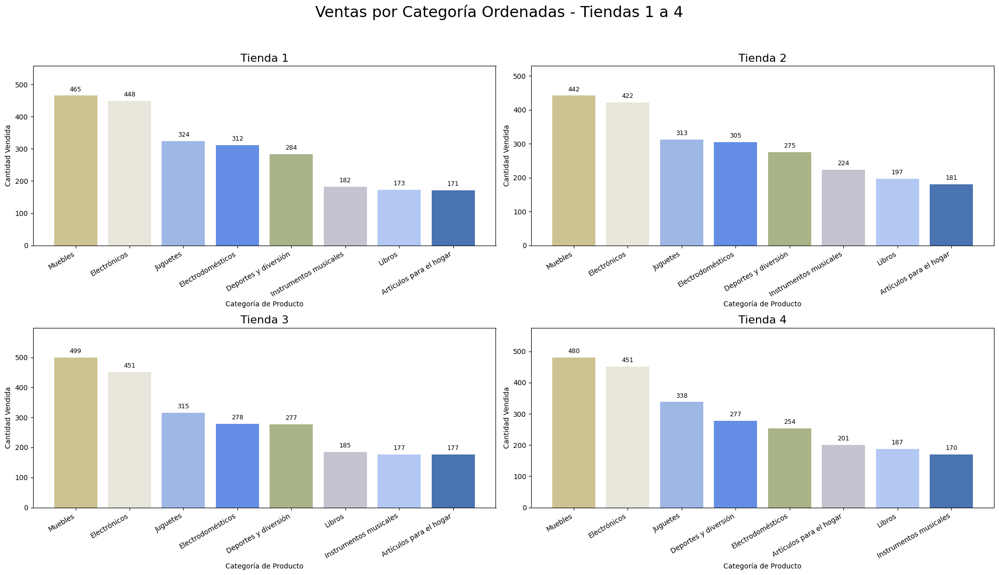

In [15]:
'''
Gráficos de barras individuales por tienda,
mostrando las categorías ordenadas por ventas (de mayor a menor).
'''

fig, axs = plt.subplots(2, 2, figsize=(20, 12))  # 2x2 para las 4 tiendas
fig.suptitle("Ventas por Categoría Ordenadas - Tiendas 1 a 4", fontsize=22)

# Obtener los nombres de las tiendas desde el resumen ya construido
tiendas_lista = list(resumen_ventas_ordenado.keys())

# Iterar por cada tienda y su posición en la grilla 2x2
for idx, tienda in enumerate(tiendas_lista):
    row, col = divmod(idx, 2)       # Fila y columna del subplot
    ax = axs[row][col]

    # Extraer datos ordenados de categorías y cantidades
    categorias = list(resumen_ventas_ordenado[tienda].keys())
    ventas = list(resumen_ventas_ordenado[tienda].values())

    # Crear gráfico de barras para la tienda actual
    ax.set_ylim(0, max(ventas) * 1.2)  # Límite superior con margen
    bars = ax.bar(categorias, ventas, color=colores[:len(categorias)])

    # Añadir etiquetas encima de cada barra
    for bar in bars:
        yval = bar.get_height()
        ax.text(
            bar.get_x() + bar.get_width()/2,
            yval + max(ventas) * 0.02,
            int(yval),
            ha='center',
            va='bottom',
            fontsize=9
        )

    # Personalización del gráfico
    ax.set_title(tienda, fontsize=16)
    ax.set_ylabel('Cantidad Vendida')
    ax.set_xlabel('Categoría de Producto')
    ax.set_xticklabels(categorias, rotation=30, ha='right')

# Ajustar el diseño general y dejar espacio para el título principal
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# 3. Calificación promedio de la tienda


In [16]:
'''
Calcular y mostrar la calificación promedio de cada tienda.
'''


# Lista de DataFrames y sus nombres correspondientes
tiendas = [tienda1, tienda2, tienda3, tienda4]
nombres = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']

# Diccionario para almacenar los promedios
calificaciones_promedio = {}

# Calcular el promedio de la columna 'Calificación' para cada tienda
for tienda_df, nombre in zip(tiendas, nombres):
    promedio = tienda_df['Calificación'].mean()
    calificaciones_promedio[nombre] = round(promedio, 2)  # Redondear a 2 decimales

# Mostrar resultados de forma clara
print("\n Calificaciones Promedio por Tienda:")
for tienda, promedio in calificaciones_promedio.items():
    print(f"   - {tienda}: {promedio}")


 Calificaciones Promedio por Tienda:
   - Tienda 1: 3.98
   - Tienda 2: 4.04
   - Tienda 3: 4.05
   - Tienda 4: 4.0


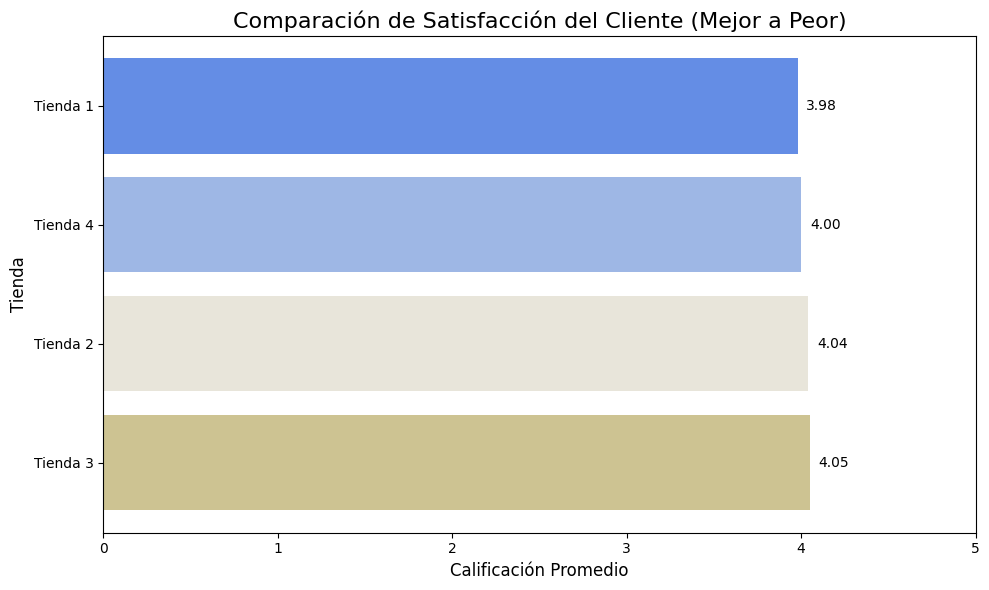

In [17]:
'''
Gráfico de barras horizontales que muestra la calificación
promedio de cada tienda, ordenadas de mayor a menor.
'''

# 1. Ordenar las tiendas por calificación promedio (de mayor a menor)
calificaciones_ordenadas = dict(
    sorted(calificaciones_promedio.items(), key=lambda x: x[1], reverse=True)
)

# 2. Crear gráfico horizontal
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.barh(
    list(calificaciones_ordenadas.keys()),
    list(calificaciones_ordenadas.values()),
    color=colores[:4]
)

# 3. Agregar etiquetas con los valores sobre cada barra
for bar in bars:
    width = bar.get_width()  # En barh el ancho representa el valor
    ax.text(
        width + 0.05,  # Desplazamiento hacia la derecha
        bar.get_y() + bar.get_height() / 2,  # Centrado verticalmente
        f"{width:.2f}",  # Mostrar 2 decimales
        ha='left',
        va='center',
        fontsize=10
    )

# 4. Personalización del gráfico
ax.set_xlim(0, 5)  # Rango de calificaciones (de 0 a 5)
ax.set_xlabel('Calificación Promedio', fontsize=12)
ax.set_ylabel('Tienda', fontsize=12)
ax.set_title('Comparación de Satisfacción del Cliente (Mejor a Peor)', fontsize=16)

plt.tight_layout()
plt.show()

# 4. Productos más y menos vendidos

In [41]:
# Unimos todos los DataFrames de tiendas
ventas_total = pd.concat([tienda1, tienda2, tienda3, tienda4])

# Productos más y menos vendidos por tienda
productos_por_tienda = {}

for i, tienda_df in enumerate([tienda1, tienda2, tienda3, tienda4], start=1):
    conteo = tienda_df["Producto"].value_counts()
    mas_vendido = conteo.idxmax()
    menos_vendido = conteo.idxmin()
    productos_por_tienda[f"Tienda {i}"] = {
        "Más vendido": (mas_vendido, int(conteo[mas_vendido])),
        "Menos vendido": (menos_vendido, int(conteo[menos_vendido]))
    }

# Productos más y menos vendidos en total
conteo_total = ventas_total["Producto"].value_counts()
mas_vendido_total = conteo_total.idxmax()
menos_vendido_total = conteo_total.idxmin()

productos_total = {
    "Más vendido": (mas_vendido_total, int(conteo_total[mas_vendido_total])),
    "Menos vendido": (menos_vendido_total, int(conteo_total[menos_vendido_total]))
}

# Mostrar resultados
from pprint import pprint
print(" Productos más y menos vendidos por tienda:")
pprint(productos_por_tienda)
print("\n Productos más y menos vendidos en total:")
pprint(productos_total)

 Productos más y menos vendidos por tienda:
{'Tienda 1': {'Menos vendido': ('Auriculares con micrófono', 33),
              'Más vendido': ('Microondas', 60)},
 'Tienda 2': {'Menos vendido': ('Juego de mesa', 32),
              'Más vendido': ('Iniciando en programación', 65)},
 'Tienda 3': {'Menos vendido': ('Bloques de construcción', 35),
              'Más vendido': ('Kit de bancas', 57)},
 'Tienda 4': {'Menos vendido': ('Guitarra eléctrica', 33),
              'Más vendido': ('Cama box', 62)}}

 Productos más y menos vendidos en total:
{'Menos vendido': ('Celular ABXY', 157), 'Más vendido': ('Mesa de noche', 210)}


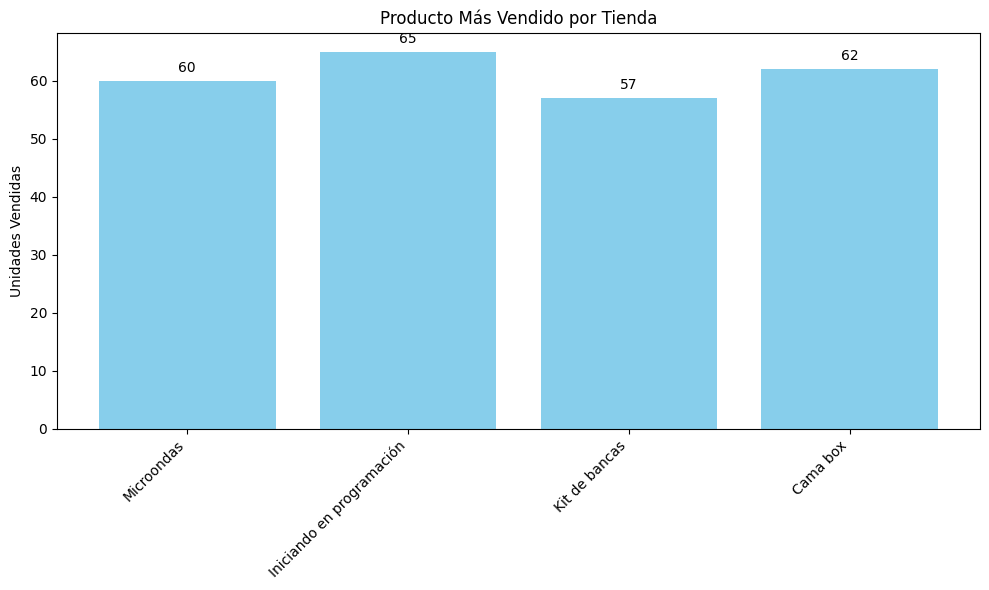

In [42]:
import matplotlib.pyplot as plt

# Extraer datos para los productos más vendidos
tiendas = list(productos_por_tienda.keys())
productos_mas_vendidos = [productos_por_tienda[t]["Más vendido"][0] for t in tiendas]
ventas_mas_vendidas = [productos_por_tienda[t]["Más vendido"][1] for t in tiendas]

# Crear gráfico
plt.figure(figsize=(10, 6))
plt.bar(tiendas, ventas_mas_vendidas, color='skyblue')
for i, val in enumerate(ventas_mas_vendidas):
    plt.text(i, val + 1, str(val), ha='center', va='bottom')

plt.title("Producto Más Vendido por Tienda")
plt.ylabel("Unidades Vendidas")
plt.xticks(ticks=range(len(tiendas)), labels=productos_mas_vendidos, rotation=45, ha='right')
plt.tight_layout()
plt.show()

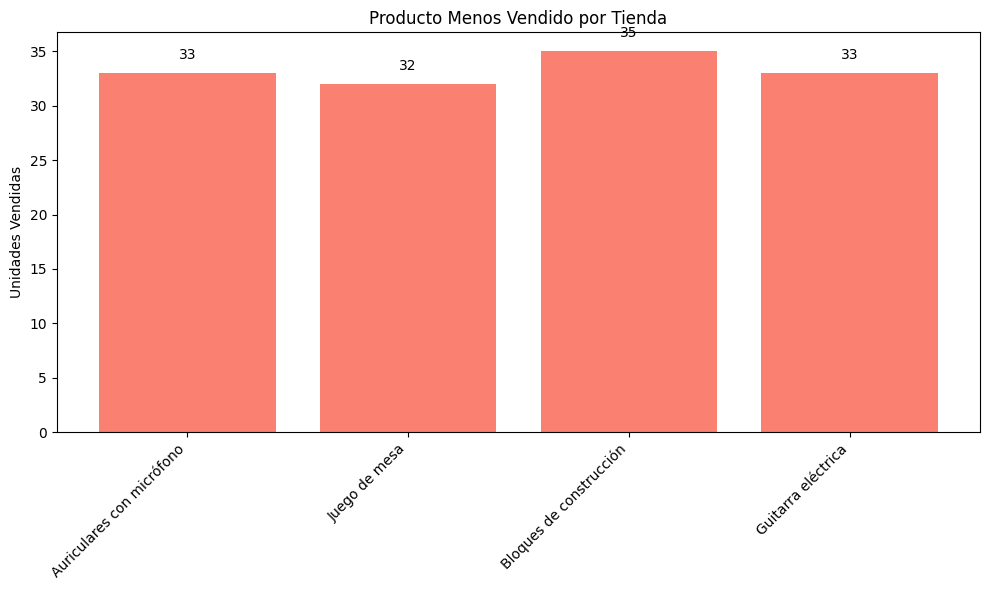

In [43]:
# Extraer datos para los productos menos vendidos
productos_menos_vendidos = [productos_por_tienda[t]["Menos vendido"][0] for t in tiendas]
ventas_menos_vendidas = [productos_por_tienda[t]["Menos vendido"][1] for t in tiendas]

# Crear gráfico
plt.figure(figsize=(10, 6))
plt.bar(tiendas, ventas_menos_vendidas, color='salmon')
for i, val in enumerate(ventas_menos_vendidas):
    plt.text(i, val + 1, str(val), ha='center', va='bottom')

plt.title("Producto Menos Vendido por Tienda")
plt.ylabel("Unidades Vendidas")
plt.xticks(ticks=range(len(tiendas)), labels=productos_menos_vendidos, rotation=45, ha='right')
plt.tight_layout()
plt.show()


# 5. Envío promedio por tienda

In [18]:
'''
Cálculo del costo de envío promedio por tienda y ordenamiento descendente.


Las variables 'tiendas' y 'nombres' ya están definidas previamente
tiendas = [tienda1, tienda2, tienda3, tienda4]
nombres = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']
'''

# Diccionario para almacenar los promedios de costo de envío
envio_promedio = {}

# Calcular el promedio del costo de envío por tienda
for tienda_df, nombre in zip(tiendas, nombres):
    promedio_envio = tienda_df['Costo de envío'].mean()
    envio_promedio[nombre] = round(promedio_envio, 2)

# Mostrar resultados de forma clara
print("\n Costo de Envío Promedio por Tienda:")
for tienda, promedio in envio_promedio.items():
    print(f"   - {tienda}: ${promedio:,.0f}")

# Ordenar el diccionario de mayor a menor costo promedio
envio_promedio_ordenado = dict(
    sorted(envio_promedio.items(), key=lambda x: x[1], reverse=True))


 Costo de Envío Promedio por Tienda:
   - Tienda 1: $26,019
   - Tienda 2: $25,216
   - Tienda 3: $24,806
   - Tienda 4: $23,459


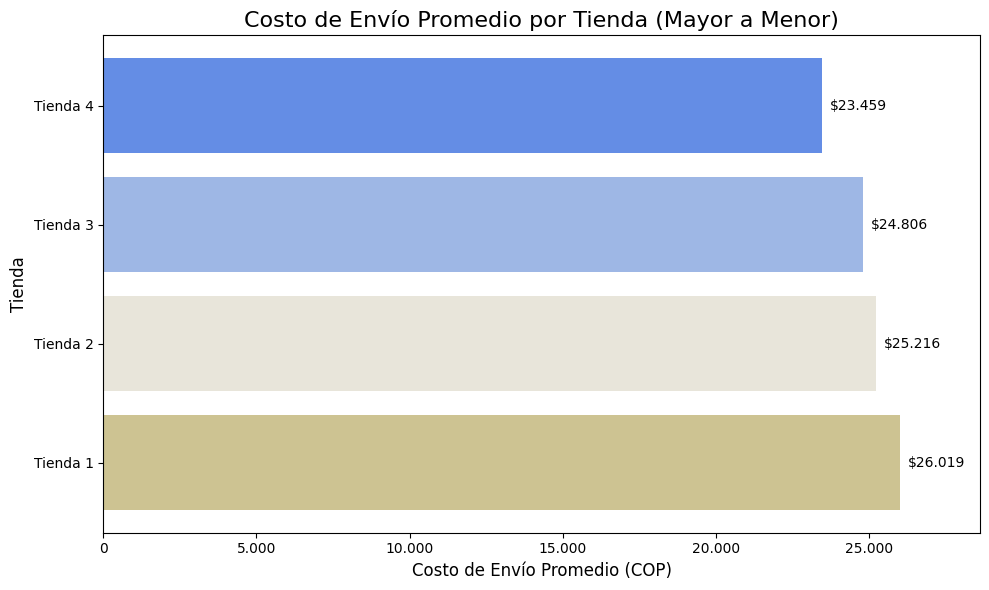

In [19]:
'''
Gráfico de barras horizontales para mostrar el costo promedio
de envío por tienda, ordenado de mayor a menor.
'''


fig, ax = plt.subplots(figsize=(10, 6))

# Crear las barras horizontales con los colores definidos
bars = ax.barh(
    list(envio_promedio_ordenado.keys()),
    list(envio_promedio_ordenado.values()),
    color=colores[:4]
)

# Ajustar el límite del eje X para que las etiquetas no se monten
maximo_actual = max(envio_promedio_ordenado.values())
ax.set_xlim(0, maximo_actual * 1.1)

# Formatear el eje X con separador de miles en formato colombiano
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"{int(x):,}".replace(",", ".")))

# Agregar etiquetas de valor a la derecha de cada barra
for bar in bars:
    width = bar.get_width()
    ax.text(
        width + maximo_actual * 0.01,   # Ligero desplazamiento a la derecha
        bar.get_y() + bar.get_height() / 2,
        f"${width:,.0f}".replace(",", "."),  # Formato COP con punto
        ha='left',
        va='center',
        fontsize=10
    )

# Personalización de ejes y título
ax.set_xlabel('Costo de Envío Promedio (COP)', fontsize=12)
ax.set_ylabel('Tienda', fontsize=12)
ax.set_title('Costo de Envío Promedio por Tienda (Mayor a Menor)', fontsize=16)

# Ajuste final del diseño
plt.tight_layout()
plt.show()

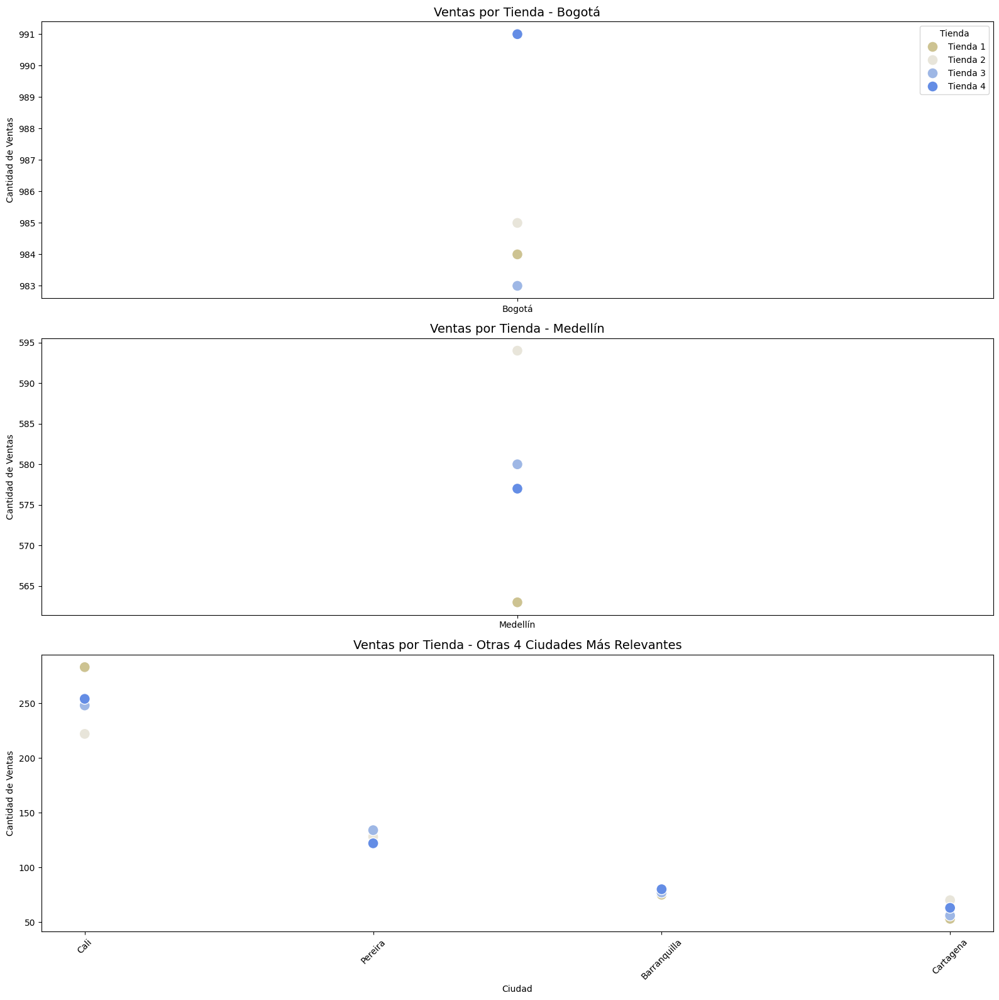

In [20]:
'''
Comparación de ventas por tienda en Bogotá, Medellín y otras
4 ciudades principales, usando gráficos de dispersión.
'''

# Agregar el nombre de la tienda como columna en cada DataFrame
tienda1['Tienda'] = 'Tienda 1'
tienda2['Tienda'] = 'Tienda 2'
tienda3['Tienda'] = 'Tienda 3'
tienda4['Tienda'] = 'Tienda 4'

# Unir todos los datos en un solo DataFrame
ventas = pd.concat([tienda1, tienda2, tienda3, tienda4])

# Agrupar por ciudad y tienda → contar número de ventas
ventas_ciudad = ventas.groupby(['Lugar de Compra', 'Tienda']).size().reset_index(name='Cantidad')

# Calcular el total de ventas por ciudad para identificar las más importantes
totales_ciudad = ventas.groupby('Lugar de Compra').size().sort_values(ascending=False)

# Definir los grupos de ciudades a graficar
ciudad1 = ['Bogotá']
ciudad2 = ['Medellín']
grupo3 = totales_ciudad[~totales_ciudad.index.isin(ciudad1 + ciudad2)].head(4).index.tolist()

# Filtrar los datos para cada grupo
ventas_1 = ventas_ciudad[ventas_ciudad['Lugar de Compra'].isin(ciudad1)].copy()
ventas_2 = ventas_ciudad[ventas_ciudad['Lugar de Compra'].isin(ciudad2)].copy()
ventas_3 = ventas_ciudad[ventas_ciudad['Lugar de Compra'].isin(grupo3)].copy()

# Asegurar orden específico en el eje X
ventas_1['Lugar de Compra'] = pd.Categorical(ventas_1['Lugar de Compra'], categories=ciudad1, ordered=True)
ventas_2['Lugar de Compra'] = pd.Categorical(ventas_2['Lugar de Compra'], categories=ciudad2, ordered=True)
ventas_3['Lugar de Compra'] = pd.Categorical(ventas_3['Lugar de Compra'], categories=grupo3, ordered=True)

# Crear la figura con 3 subgráficos (uno por grupo de ciudades)
fig, axs = plt.subplots(3, 1, figsize=(16, 16), sharey=False)

# ----- Bogotá -----
sns.scatterplot(
    data=ventas_1,
    x='Lugar de Compra',
    y='Cantidad',
    hue='Tienda',
    palette=colores[:4],
    s=150,
    ax=axs[0]
)
axs[0].set_title("Ventas por Tienda - Bogotá", fontsize=14)
axs[0].set_xlabel("")
axs[0].set_ylabel("Cantidad de Ventas")
axs[0].legend(title="Tienda")
axs[0].tick_params(axis='x', rotation=0)

# ----- Medellín -----
sns.scatterplot(
    data=ventas_2,
    x='Lugar de Compra',
    y='Cantidad',
    hue='Tienda',
    palette=colores[:4],
    s=150,
    ax=axs[1]
)
axs[1].set_title("Ventas por Tienda - Medellín", fontsize=14)
axs[1].set_xlabel("")
axs[1].set_ylabel("Cantidad de Ventas")
axs[1].legend().remove()
axs[1].tick_params(axis='x', rotation=0)

# ----- Otras ciudades importantes -----
sns.scatterplot(
    data=ventas_3,
    x='Lugar de Compra',
    y='Cantidad',
    hue='Tienda',
    palette=colores[:4],
    s=150,
    ax=axs[2]
)
axs[2].set_title("Ventas por Tienda - Otras 4 Ciudades Más Relevantes", fontsize=14)
axs[2].set_xlabel("Ciudad")
axs[2].set_ylabel("Cantidad de Ventas")
axs[2].legend().remove()
axs[2].tick_params(axis='x', rotation=45)

# Ajustar espacios generales del layout
plt.tight_layout()
plt.show()

In [21]:
'''
Mapa de calor con Folium para visualizar la concentración
geográfica de ventas en Colombia usando coordenadas lat/lon.
'''


from folium.plugins import HeatMap

# Unir los DataFrames de todas las tiendas y conservar solo latitud y longitud
ventas_coords = pd.concat([tienda1, tienda2, tienda3, tienda4])
ventas_coords = ventas_coords[['lat', 'lon']].dropna()  # Eliminar filas sin coordenadas

# Crear un mapa centrado en Colombia (aproximadamente)
m = folium.Map(location=[4.5709, -74.2973], zoom_start=6)

# Añadir la capa de calor al mapa con configuración personalizada
HeatMap(
    data=ventas_coords.values.tolist(),  # Lista de coordenadas [[lat, lon], ...]
    radius=25,       # Tamaño de influencia de cada punto
    blur=10,         # Difuminado de los bordes
    max_zoom=8       # Zoom máximo al que se renderiza bien
).add_to(m)

# Mostrar mapa interactivo
m

In [22]:
'''
Mapa interactivo con marcadores agrupados por ventas.
Cada marcador muestra detalles como producto, tienda y precio.
'''


from folium.plugins import MarkerCluster

# Calcular punto central promedio para centrar el mapa
centro_lat = ventas['lat'].mean()
centro_lon = ventas['lon'].mean()

# Crear mapa base
mapa = folium.Map(location=[centro_lat, centro_lon], zoom_start=6)

# Crear agrupador de marcadores
marker_cluster = MarkerCluster().add_to(mapa)

colores_dict = {
    'Tienda 1': colores[0],
    'Tienda 2': colores[1],
    'Tienda 3': colores[2],
    'Tienda 4': colores[3],
}

# Agregar cada venta como marcador circular al cluster
for _, fila in ventas.iterrows():
    folium.CircleMarker(
        location=[fila['lat'], fila['lon']],
        radius=4,
        color=colores_dict[fila['Tienda']],  # ✅ Color correcto según tienda
        fill=True,
        fill_opacity=0.6,
        popup=(
            f"{fila['Producto']}<br>"
            f"Tienda: {fila['Tienda']}<br>"
            f"Precio: ${fila['Precio']:,.0f}".replace(",", ".")
        )
    ).add_to(marker_cluster)

# Mostrar mapa (en Jupyter se muestra directamente)
mapa

Matriz de análisis por ciudad:


,Lugar de Compra,Ventas_Totales,Ingreso_Total,Ingreso_Promedio,Calificacion_Promedio,Latitud,Longitud
0,Bogotá,3943,1.814858e+09,460273.471976,4.113619,4.60971,-74.08175
1,Medellín,2314,1.096669e+09,473927.917027,3.926534,6.25184,-75.56359
2,Cali,1007,5.065261e+08,503005.064548,4.046673,3.43722,-76.52250
3,Pereira,517,2.259273e+08,436996.711799,4.013540,4.81333,-75.69611
4,Barranquilla,310,1.320405e+08,425937.096774,3.803226,10.96854,-74.78132
5,Cartagena,242,1.023767e+08,423044.214876,4.020661,10.39972,-75.51444
6,Cúcuta,186,9.936910e+07,534242.473118,3.940860,7.89391,-72.50782
7,Bucaramanga,181,9.057330e+07,500404.972376,3.977901,7.12539,-73.11980
8,Riohacha,163,7.387970e+07,453249.693252,3.895706,11.54444,-72.90722
9,Santa Marta,151,5.310050e+07,351658.940397,3.596026,11.24079,-74.19904


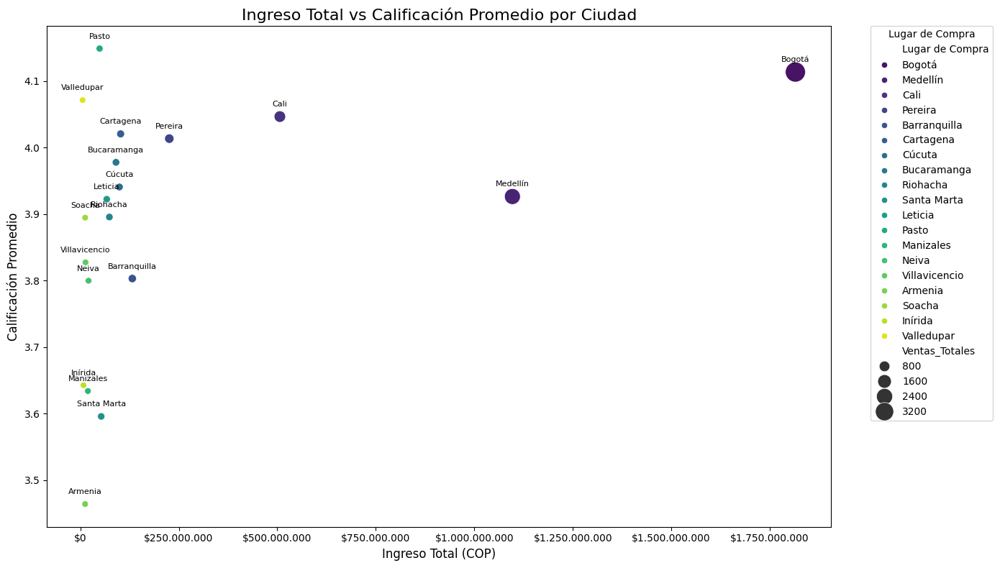


 Matriz de correlación entre métricas clave:


,Ventas_Totales,Ingreso_Total,Ingreso_Promedio,Calificacion_Promedio
Ventas_Totales,1.000000,0.999579,-0.096617,0.375269
Ingreso_Total,0.999579,1.000000,-0.083418,0.380507
Ingreso_Promedio,-0.096617,-0.083418,1.000000,0.121458
Calificacion_Promedio,0.375269,0.380507,0.121458,1.000000


In [23]:
# --- LIBRERÍAS NECESARIAS ---
from scipy.stats import zscore
from folium import Map, CircleMarker
from folium.plugins import MarkerCluster, HeatMap
from matplotlib.ticker import FuncFormatter
from IPython.display import display
from matplotlib.ticker import FuncFormatter

# --- CARGA Y UNIÓN DE DATOS ---
# Leer los datos de cada tienda desde sus URLs
tiendas = [tienda1, tienda2, tienda3, tienda4]
for i, df in enumerate(tiendas, 1):
    df["Tienda"] = f"Tienda {i}"

# Unir todos los DataFrames en uno solo
ventas = pd.concat(tiendas)

# --- MATRIZ RESUMEN POR CIUDAD ---
# Agrupación para análisis por ubicación geográfica
matriz = ventas.groupby("Lugar de Compra").agg(
    Ventas_Totales=("Precio", "count"),
    Ingreso_Total=("Precio", "sum"),
    Ingreso_Promedio=("Precio", "mean"),
    Calificacion_Promedio=("Calificación", "mean"),
    Latitud=("lat", "mean"),
    Longitud=("lon", "mean")
).reset_index()

# Ordenar la matriz de mayor a menor según número de ventas
matriz = matriz.sort_values(by="Ventas_Totales", ascending=False).reset_index(drop=True)

# Mostrar tabla de resumen
print("Matriz de análisis por ciudad:")
display(matriz)  # Puedes usar display() si estás en Jupyter, o print() si no

# --- GRÁFICO DE DISPERSIÓN MEJORADO CON NOMBRES DE CIUDAD ---
plt.figure(figsize=(14, 8))  # Aumentar tamaño del lienzo

scatter = sns.scatterplot(
    data=matriz,
    x="Ingreso_Total",
    y="Calificacion_Promedio",
    hue="Lugar de Compra",
    size="Ventas_Totales",
    sizes=(40, 400),
    palette="viridis"
)

# Añadir nombres de ciudades directamente sobre los puntos
for _, row in matriz.iterrows():
    plt.text(
        row["Ingreso_Total"],                    # X
        row["Calificacion_Promedio"] + 0.015,    # Y (ligeramente más arriba)
        row["Lugar de Compra"],                  # Texto
        fontsize=8,
        ha='center'
    )

# Títulos y etiquetas
plt.title("Ingreso Total vs Calificación Promedio por Ciudad", fontsize=16)
plt.xlabel("Ingreso Total (COP)", fontsize=12)
plt.ylabel("Calificación Promedio", fontsize=12)

# Formatear los valores del eje X con separador de miles
formatter = FuncFormatter(lambda x, _: f"${int(x):,}".replace(",", "."))
scatter.xaxis.set_major_formatter(formatter)

# Mover leyenda a la derecha
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., title="Lugar de Compra")

# Ajuste general
plt.tight_layout()
plt.show()

# --- MATRIZ DE CORRELACIÓN ---
# Correlaciones entre métricas clave
correlacion = matriz[["Ventas_Totales", "Ingreso_Total", "Ingreso_Promedio", "Calificacion_Promedio"]].corr()

# Mostrar tabla de correlación
print("\n Matriz de correlación entre métricas clave:")
display(correlacion)

Respetado señor Juan, como ánalista de datos le recomiendo vender la tienda 4 debido a que es la menos rentable, esto sustentado en los siguientes criterios:

1. Análisis de facturación

En en ánalisis de facturación se realizó el resumen de los ingresos totales por tienda, de manera bruta y neta (Ingreso posterior al pago del envío) En este caso la tienda que mas vende es la número 1 y la que menos es al tienda 4, con una diferencia de al rededor de $112.504.700, y al an+alisar el impacto de los envíos en las tiendas, se concluye que su impacto es nulo ya que todas gastan lo mismo en envios (5,33%). En este punto la tienda con menor desempeño es la número 4

2. Ventas por categoría

Las categorias de venta son las siguientes: 'Muebles', 'Electrónicos', 'Juguetes', 'Electrodomésticos', 'Deportes y diversión', 'Instrumentos musicales', 'Libros', 'Artículos para el hogar', de las cuales la categoría más vendida son los muebles en segundo lugar los electricos, las dos categorias menos vendidas son Libros, Artículos para el hogar. Pero estos datos por si solos no son suficientes para tomar una decisión, de este ánalisis solo pudo concluirse que, la tienda que vende más muebles es la tienda 3 y la que menos es la tienda 2.

En este analisis tambien se analizó el ingreso total por categoria hallando que la categoria de electronicos y eletrodomesticos por lo cual es el verdadero analisis y criterio para vender una tienda es la que venda menos de estas dos categorias en ambos casos es la tienda 4

3. Calificación promedio de la tienda

La tienda con mejor calificación es la tienda 3 y la que tiene peor calificación es la 1. Aparentemente el mayor número de ventas totales repercute negativamente en la calificación, aunque este caso requiere mayor análisis.
   - Tienda 1: 3.98
   - Tienda 2: 4.04
   - Tienda 3: 4.05
   - Tienda 4: 4.0


4. Productos más y menos vendidos
Los productos más y menos vendios respectivamente son los siguientes, como más vendido es la mesa de noche, con 210 unidades y como menos el Celular ABXY con 157, no se profundizo más en este análisis ya que no se encontro información valiosa en el analisis preliminar.

5. Costo de envío.

Como se menciono en el primer criterio este valor no tiene relevancia para la elección.

Dado que el señor Juan busca vender la tienda menos rentable se sugiere vender al tienda número 4 ya que es la que menos dinero produce y la que tiene menos ventas de los productos que más generan ventas en dinero.

---

Una versión más clara de analisis.

1. Facturación Total y Rentabilidad
Se calcularon los ingresos brutos (ventas totales) y los ingresos netos (descontando costos de envío) por tienda. La tienda con mayor facturación fue la Tienda 1, mientras que la Tienda 4 presentó el menor desempeño, con una diferencia aproximada de $112.504.700 frente a la Tienda 1.

Además, el impacto del costo de envío fue igual en todas las tiendas (5.33%), por lo que no es un factor diferenciador en la rentabilidad. En conclusión, la Tienda 4 es la menos rentable en términos absolutos.

2. Ventas e Ingresos por Categoría
Las categorías más vendidas en volumen fueron Muebles y Electrónicos, mientras que Libros y Artículos para el hogar tuvieron menor rotación. Sin embargo, al analizar los ingresos generados por categoría, las más relevantes en términos de facturación fueron Electrónicos y Electrodomésticos.

La Tienda 4 es la que menos ingresos obtiene en ambas categorías clave, lo que compromete aún más su sostenibilidad comercial.

3. Calificación Promedio de los Clientes
La calificación promedio de los usuarios ubica a la Tienda 3 como la mejor valorada (4.05), y a la Tienda 1 como la peor (3.98). Aunque las diferencias no son drásticas, podrían relacionarse con el volumen de operaciones. No obstante, la Tienda 4 no destaca en este aspecto (4.00).

4. Productos Más y Menos Vendidos
El producto más vendido fue la Mesa de noche (210 unidades), y el menos vendido fue el Celular ABXY (157 unidades). Este análisis no arrojó diferencias significativas entre tiendas, por lo que no representa un criterio determinante para la toma de decisión.

5. Costo Promedio de Envío
El análisis confirmó que el porcentaje del costo de envío respecto a las ventas es constante en todas las tiendas (~5.33%), por lo cual no representa un factor relevante para determinar el desempeño relativo.

Conclusión y Recomendación
Considerando los criterios de facturación, participación en las categorías más rentables y desempeño general, se recomienda la venta de la Tienda 4, al ser consistentemente la que presenta menores ingresos, menor participación en productos de alto valor, y sin ninguna ventaja competitiva frente a las demás.

Estoy atento a cualquier ampliación o visualización que desee incluir en la presentación de este informe.

Atentamente,
Alejandro Chaurra Morales
Analista de Datos